In [10]:
from google.colab import files
uploaded = files.upload()

Saving cleaned_geospatial_data_no_ocean.csv to cleaned_geospatial_data_no_ocean.csv


In [11]:
import pandas as pd
df = pd.read_csv('cleaned_geospatial_data_no_ocean.csv')
df

,longitude,latitude
0,36.861544,-5.177747
1,36.821091,-2.443153
2,38.964631,-2.884812
3,41.191395,-1.784323
4,49.997903,8.267671
...,...,...
1983,37.182672,-3.586795
1984,40.779395,9.039580
1985,37.963461,13.301546
1986,50.003216,9.717080


In [12]:
df.head()

,longitude,latitude
0,36.861544,-5.177747
1,36.821091,-2.443153
2,38.964631,-2.884812
3,41.191395,-1.784323
4,49.997903,8.267671


In [13]:
X = df[['longitude', 'latitude']]

In [14]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3)
y_means = kmeans.fit_predict(X)

In [15]:
df_kmeans = df.copy()

In [16]:
y_means

array([1, 1, 1, ..., 0, 0, 0], dtype=int32)

In [17]:
df['y'] = y_means
df.head()

,longitude,latitude,y
0,36.861544,-5.177747,1
1,36.821091,-2.443153,1
2,38.964631,-2.884812,1
3,41.191395,-1.784323,1
4,49.997903,8.267671,0


In [18]:
kmeans.fit(X)

KMeans(n_clusters=3)

In [19]:
print("Inertia: ", kmeans.inertia_)

Inertia:  73672.6591545818


In [20]:
df = df[:2000]

cluster1 = df[df['y'] == 0][['latitude', 'longitude']].values.tolist()
cluster2 = df[df['y'] == 1][['latitude', 'longitude']].values.tolist()
cluster3 = df[df['y'] == 2][['latitude', 'longitude']].values.tolist()

In [21]:
import folium
map = folium.Map(location=[4.9545, 48.9821], zoom_start=10)
map

In [22]:
# Loop for cluster 1 (Blue)
for i in cluster1:
    folium.CircleMarker(i, radius=2, color='blue', fill=True, fill_color='blue').add_to(map)

# Loop for cluster 2 (Red)
for i in cluster2:
    folium.CircleMarker(i, radius=2, color='red', fill=True, fill_color='red').add_to(map)

# Loop for cluster 3 (Green)
for i in cluster3:
    folium.CircleMarker(i, radius=2, color='green', fill=True, fill_color='green').add_to(map)

In [23]:
df_cleaned = df[(df["latitude"].between(-90, 90)) & (df["longitude"].between(-180, 180))]

print("Before:", len(df))
print("After:", len(df_cleaned))

Before: 1988
After: 1988


# **KMeans Clutsering**

In [24]:
map

# **DBSCAN**

In [31]:
from sklearn.cluster import DBSCAN

Converting to radians for Haversine distance

In [32]:
import numpy as np
coords_rad = np.radians(X)

parameters for DBSCAN

In [33]:
eps = 0.017
min_samples = 5

In [34]:
dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='haversine').fit(coords_rad)
df = df.copy()
df.loc[:, 'cluster'] = dbscan.labels_

In [35]:
map_clusters = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=5)
map_clusters

In [36]:
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige',
          'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'pink', 'lightblue', 'lightgreen']

In [37]:
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(map_clusters)

We will leverage this Elbow point (where the point bends sharply)to determine good eps

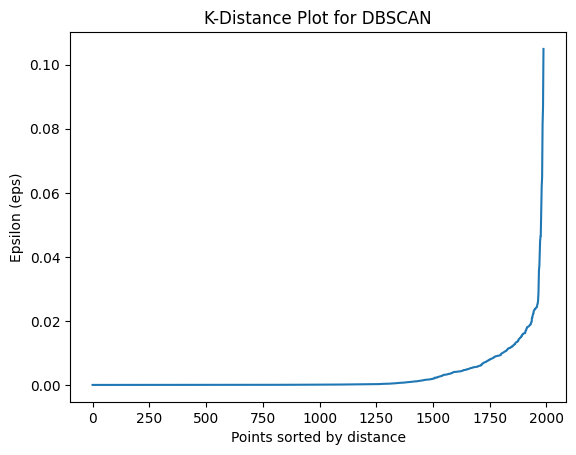

In [38]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

X = df[['latitude', 'longitude']].to_numpy()
neigh = NearestNeighbors(n_neighbors=5, metric='haversine')
neigh.fit(np.radians(X))
distances, _ = neigh.kneighbors(np.radians(X))

distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.xlabel("Points sorted by distance")
plt.ylabel("Epsilon (eps)")
plt.title("K-Distance Plot for DBSCAN")
plt.show()

In [39]:
for idx, row in df.iterrows():
    cluster_id = row['cluster']
    if cluster_id == -1:
        color = 'black'  # Noise points
    else:
        color = colors[int(cluster_id) % len(colors)] if cluster_id != -1 else 'black'

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=f"Cluster {cluster_id}"
    ).add_to(marker_cluster)


map_clusters

# **Agglomerative Hierarchical Clustering**

In [42]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

In [45]:
df = pd.read_csv('cleaned_geospatial_data_no_ocean.csv')

In [46]:
X = df[['latitude', 'longitude']].values

In [47]:
n_clusters = 3
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
df['cluster'] = agg_clustering.fit_predict(X)

In [48]:
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown']
map_clusters = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=5)

In [54]:
for idx, row in df.iterrows():
    cluster_id = int(row['cluster'])  # Convert cluster label to integer
    color = colors[cluster_id % len(colors)]  # Ensure it stays within range

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6
    ).add_to(map_clusters)

In [55]:
map_clusters

Now, using Dendrogram to represent the data points in Agglomerative Clustering

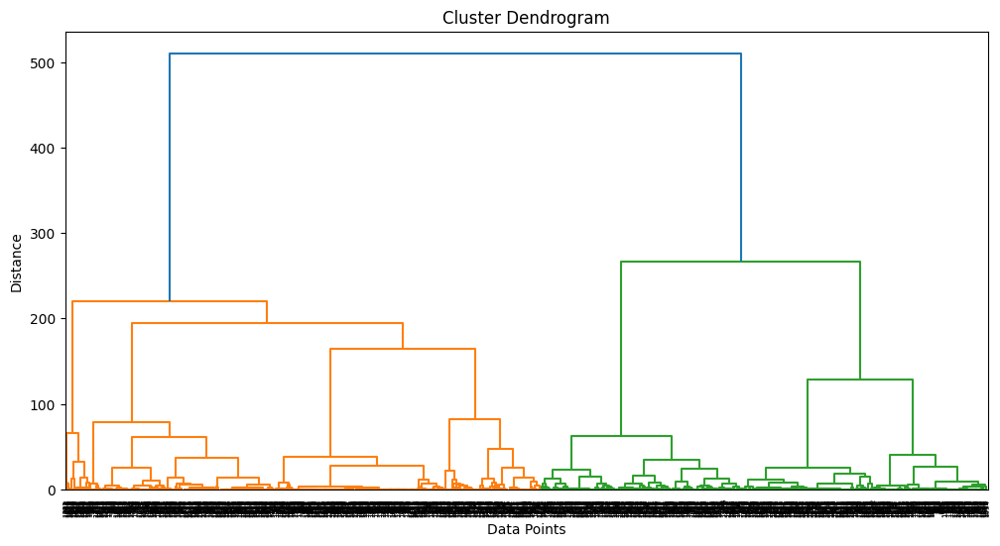

In [56]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

Z = linkage(X, method='ward')

plt.figure(figsize=(12, 6))
dendrogram(Z)
plt.title("Cluster Dendrogram")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()


# **HDBSCAN**

In [58]:
import hdbscan
import numpy as np
import pandas as pd
import folium

In [59]:
X = df[['latitude', 'longitude']].values

In [60]:
X_rad = np.radians(X)

In [79]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=3, min_samples=1, cluster_selection_epsilon=0.005, metric='haversine', cluster_selection_method='eom')
df['cluster'] = clusterer.fit_predict(X_rad)  # Assign cluster labels


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [80]:
import matplotlib.pyplot as plt
colors = plt.cm.get_cmap("tab10", len(set(df['cluster'])))
map_clusters = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=5)

<ipython-input-80-d46116c18e1e>:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", len(set(df['cluster'])))


In [81]:
for idx, row in df.iterrows():
    cluster_id = row['cluster']
    color = "black" if cluster_id == -1 else f"#{int(colors(cluster_id)[0]*255):02x}{int(colors(cluster_id)[1]*255):02x}{int(colors(cluster_id)[2]*255):02x}"

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6
    ).add_to(map_clusters)

map_clusters

In [84]:
from sklearn.metrics import silhouette_score

silhouette = silhouette_score(X, df['cluster'])
print(f"Silhouette Score: {silhouette}")


Silhouette Score: 0.7881329467326207
